In [1]:
import torch
import torchvision
import torch.nn as nn
import torchvision.transforms as transforms
import numpy as np
from torch.utils.data import DataLoader, random_split
import torch.nn.functional as F
from matplotlib import pyplot as plt
import torch.optim as optim
import random
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

In [2]:
torch.cuda.set_device(0)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

In [3]:
device

device(type='cuda')

# Ładowanie danych i tworzenie datasetu

In [4]:
transform = transforms.Compose(
    [
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ]
)

In [5]:
dataset_orig = torchvision.datasets.ImageFolder("beer_labels", transform=transform) # dataset zawierający wszystkie dostępne dane

In [6]:
len(dataset_orig)

8007

### Wybranie około 50% zdjęć z każdej klasy do zbioru treningowego
Druga połowa zbioru posłuży jako zbiór testowy

In [7]:
classes_indices_dict = {classname: [] for classname in dataset_orig.class_to_idx.values()}
for i, (path, classname) in enumerate(dataset_orig.imgs):
    classes_indices_dict[classname].append(i)

In [8]:
subset_train_indices_dict = {classname: [] for classname in dataset_orig.class_to_idx.values()}
for classname, indices in subset_train_indices_dict.items():
    subset_train_indices_dict[classname] = random.sample(classes_indices_dict[classname], k=len(classes_indices_dict[classname])//2)

In [9]:
subset_test_indices_dict = {classname: [] for classname in dataset_orig.class_to_idx.values()}
for classname, indices in subset_test_indices_dict.items():
    subset_test_indices_dict[classname] = [i for i in classes_indices_dict[classname] if i not in subset_train_indices_dict[classname]]

In [10]:
subset_train_indices = [i for x in subset_train_indices_dict.values() for i in x]
subset_test_indices = [i for x in subset_test_indices_dict.values() for i in x]

In [11]:
train_subset = torch.utils.data.Subset(dataset_orig, subset_train_indices)
test_subset = torch.utils.data.Subset(dataset_orig, subset_test_indices)

In [12]:
len(train_subset), len(test_subset)

(3981, 4026)

In [13]:
len(train_subset)/len(dataset_orig)

0.4971899587860622

### Rozkład klas w zbiorze treningowym

In [14]:
class_idx, counts = np.unique([train_subset[i][1] for i in range(len(train_subset))], return_counts=True)
y, x = counts, list(dataset_orig.class_to_idx.values())

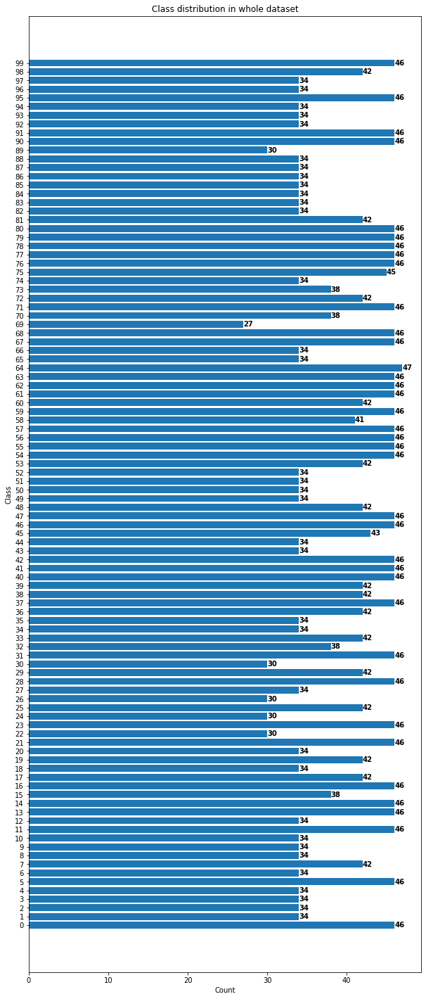

In [15]:
plt.figure(figsize=(10,25))
plt.barh(y=[str(i) for i in x], width=y)
plt.title('Class distribution in whole dataset')
plt.xlabel('Count')
plt.ylabel('Class')
for i, v in enumerate(y):
    plt.text(v, i, str(v), color='black', va='center', fontweight='bold')

### Wydzielenie zbioru walidacyjnego ze zbioru treningowego

In [16]:
train_size = int(0.8 * len(train_subset))
val_size = len(train_subset) - train_size
trainset, valset = random_split(train_subset, [train_size, val_size])

In [17]:
train_size, val_size, len(test_subset)

(3184, 797, 4026)

In [18]:
BATCH_SIZE = 32
NUM_WORKERS = 2

In [19]:
trainloader_orig = torch.utils.data.DataLoader(train_subset, batch_size=BATCH_SIZE, num_workers=2, shuffle=True) # cały zbiór treningowy (50% całego zbioru)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=BATCH_SIZE, num_workers=2, shuffle=True) # zbiór treningowy (40% całego zbioru)
valloader = torch.utils.data.DataLoader(valset, batch_size=BATCH_SIZE, num_workers=2, shuffle=True) # zbiór walidacyjny (10% całego zbioru)
testloader = torch.utils.data.DataLoader(test_subset, batch_size=BATCH_SIZE, num_workers=2, shuffle=False) # zbiór testowy (50% całego zbioru)

In [20]:
next(iter(trainloader))[0][0].shape # size of image

torch.Size([3, 299, 299])

### Wizualizacja kilku zdjęć ze zbioru

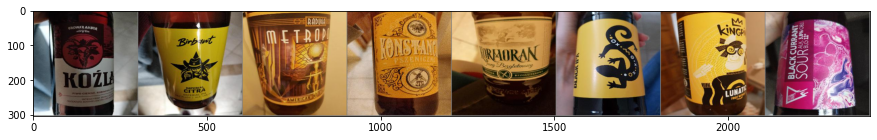

GroundTruth:     76    21    94     1     4    41    31    75


In [21]:
def imshow(img):
    img = img / 2 + 0.5 # denormalizacja obrazu
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

dataiter = iter(trainloader)
random_images, random_labels = dataiter.next()
random_images = random_images[:8]

plt.rcParams['figure.figsize'] = 15, 10
imshow(torchvision.utils.make_grid(random_images))
print('GroundTruth: ', ' '.join('%5s' % dataset_orig.class_to_idx[dataset_orig.classes[random_labels[j]]] for j in range(8)))

# Konwolucyjna sieć neuronowa

### Funkcje pomocnicze

In [22]:
def get_accuracy(model, loader):
    correct = 0
    total = 0
    model.eval()
    with torch.no_grad():
        for data in loader:

            images, labels = data
            images = images.to(device)

            outputs = model(images).cpu()

            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    return correct / total

In [23]:
def plot_training(iters, losses, train_acc, test_acc=None):
    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.title("Training Curve")
    plt.plot(iters, losses, label="Train")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")

    plt.subplot(1,2,2)
    plt.title("Training Curve")
    plt.plot(iters, train_acc, label="Train")
    if test_acc:
        plt.plot(iters, test_acc, label="Validation")
    plt.xlabel("Iterations")
    plt.ylabel("Training Accuracy")
    plt.legend(loc='best')

    plt.show()

In [24]:
class BeerClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=4, kernel_size=(3,3), stride=(1,1), padding=1)
        self.pool1 = nn.MaxPool2d(2, 2) # -> 149x149x4
        self.bn1 = nn.BatchNorm2d(4)

        self.conv2 = nn.Conv2d(in_channels=4, out_channels=8, kernel_size=(3,3), stride=(1,1), padding=1)
        self.pool2 = nn.MaxPool2d(2, 2) # -> 74x74x8
        self.bn2 = nn.BatchNorm2d(8)

        self.conv3 = nn.Conv2d(in_channels=8, out_channels=16, kernel_size=(3,3), stride=(1,1), padding=1)
        self.pool3 = nn.MaxPool2d(2, 2) # -> 32x37x16
        self.bn3 = nn.BatchNorm2d(16)

        self.fc1 = nn.Linear(16 * 37 * 37, 128)
        self.drop1 = nn.Dropout(0.6)
        self.fc3 = nn.Linear(128, 100)

    def forward(self, x):
        x = self.bn1(self.pool1(F.relu(self.conv1(x))))
        x = self.bn2(self.pool2(F.relu(self.conv2(x))))
        x = self.bn3(self.pool3(F.relu(self.conv3(x))))

        x = torch.flatten(x, 1)
        x = self.drop1(F.relu(self.fc1(x)))
        x = self.fc3(x)
        return x

In [25]:
beer_classifier = BeerClassifier().to(device)
beer_classifier

BeerClassifier(
  (conv1): Conv2d(3, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (bn1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(4, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (bn2): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (bn3): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=21904, out_features=128, bias=True)
  (drop1): Dropout(p=0.6, inplace=False)
  (fc3): Linear(in_features=128, out_features=100, bias=True)
)

# Trening sieci i strojenie hiperparametrów
Trening na części zbioru treningowego oraz ewaluacja przy pomocy zbioru walidacyjnego

In [26]:
LR = 0.0005
EPOCHS = 5
WEIGHT_DECAY = 0.0005

In [27]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(beer_classifier.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)

In [28]:
iters = []
losses = []
train_acc_ls = []
val_acc_ls = []

for epoch in range(EPOCHS):
    beer_classifier.train()
    epoch_losses = []
    for i, data in enumerate(trainloader, 0):

        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()

        outputs = beer_classifier(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        epoch_losses.append(loss.item())

    iters.append(epoch)
    loss_mean = np.array(epoch_losses).mean()
    losses.append(loss_mean)

    train_acc = get_accuracy(beer_classifier, trainloader)
    val_acc = get_accuracy(beer_classifier, valloader)
    train_acc_ls.append(train_acc)
    val_acc_ls.append(val_acc)

    print(f"[{epoch+1}/{EPOCHS}] loss: {loss_mean:.3} train_acc: {100*train_acc:.3}% val_acc: {100*val_acc:.3}%")

print('Finished Training')

[1/5] loss: 4.38 train_acc: 36.5% val_acc: 21.2%
[2/5] loss: 3.21 train_acc: 77.7% val_acc: 47.9%
[3/5] loss: 2.15 train_acc: 92.9% val_acc: 62.9%
[4/5] loss: 1.4 train_acc: 98.3% val_acc: 73.3%
[5/5] loss: 0.956 train_acc: 99.6% val_acc: 77.7%
Finished Training


### Wizualizacja przebiegu treningu

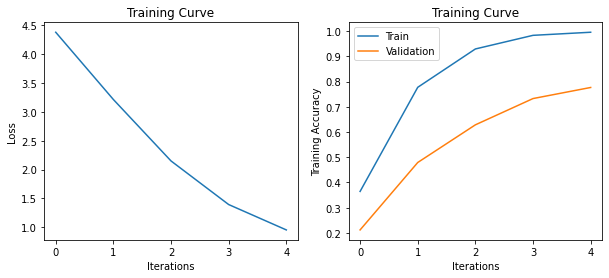

In [29]:
plot_training(iters, losses, train_acc_ls, val_acc_ls)

# Ostateczny trening modelu
Trening na całym dostępnym zbiorze danych, czyli 50% całego datasetu

In [30]:
beer_classifier = BeerClassifier().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(beer_classifier.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)

In [31]:
iters = []
losses = []
train_acc_ls = []

for epoch in range(EPOCHS):
    beer_classifier.train()
    epoch_losses = []
    for i, data in enumerate(trainloader_orig, 0):

        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()

        outputs = beer_classifier(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        epoch_losses.append(loss.item())

    iters.append(epoch)
    loss_mean = np.array(epoch_losses).mean()
    losses.append(loss_mean)

    train_acc = get_accuracy(beer_classifier, trainloader_orig)
    train_acc_ls.append(train_acc)

    print(f"[{epoch+1}/{EPOCHS}] loss: {loss_mean:.3} train_acc: {100*train_acc:.3}%")

print('Finished Training')

[1/5] loss: 4.35 train_acc: 39.1%
[2/5] loss: 3.13 train_acc: 75.2%
[3/5] loss: 2.15 train_acc: 91.2%
[4/5] loss: 1.47 train_acc: 96.9%
[5/5] loss: 1.1 train_acc: 98.6%
Finished Training


### Wizualizacja przebiegu treningu

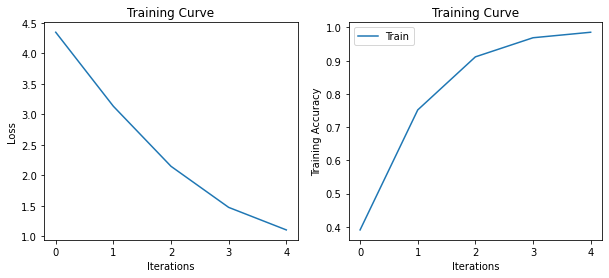

In [32]:
plot_training(iters, losses, train_acc_ls)

## Zapisanie modelu

In [33]:
torch.save(beer_classifier.state_dict(), "./beer_classifier.pth")

# Ewaluacja modelu na zbiorze testowym

In [34]:
correct_pred = {str(classname): 0 for classname in dataset_orig.class_to_idx.values()}
incorrect_pred = {str(classname): [] for classname in dataset_orig.class_to_idx.values()}
total_pred = {str(classname): 0 for classname in dataset_orig.class_to_idx.values()}
y_pred = []
y_true = []

with torch.no_grad():
    beer_classifier.eval()
    for batch_idx, data in enumerate(testloader):
        images, labels = data
        images = images.to(device)
        outputs = beer_classifier(images).cpu()
        _, predictions = torch.max(outputs, 1)
        # collect the correct predictions for each class
        for img_idx, (label, prediction) in enumerate(zip(labels, predictions)):
            if label == prediction:
                correct_pred[str(label.item())] += 1
            else:
                # store incorrectly classified images
                incorrect_pred[str(label.item())].append(dataset_orig.imgs[batch_idx+img_idx][0])
            total_pred[str(label.item())] += 1

        y_pred.extend(predictions)
        y_true.extend(labels)

y_true = [dataset_orig.class_to_idx[dataset_orig.classes[i]] for i in y_true]
y_pred = [dataset_orig.class_to_idx[dataset_orig.classes[i]] for i in y_pred]

acc_dict = dict()
for classname, correct_count in correct_pred.items():
    accuracy = 100 * float(correct_count) / total_pred[classname]
    acc_dict[classname] = accuracy
    print("Accuracy for class {:5s} is: {:.1f} %".format(classname,
                                                         accuracy))

Accuracy for class 0     is: 87.0 %
Accuracy for class 1     is: 85.7 %
Accuracy for class 2     is: 85.7 %
Accuracy for class 3     is: 71.4 %
Accuracy for class 4     is: 37.1 %
Accuracy for class 5     is: 56.5 %
Accuracy for class 6     is: 68.6 %
Accuracy for class 7     is: 71.4 %
Accuracy for class 8     is: 71.4 %
Accuracy for class 9     is: 62.9 %
Accuracy for class 10    is: 65.7 %
Accuracy for class 11    is: 87.0 %
Accuracy for class 12    is: 68.6 %
Accuracy for class 13    is: 95.7 %
Accuracy for class 14    is: 87.0 %
Accuracy for class 15    is: 63.2 %
Accuracy for class 16    is: 65.2 %
Accuracy for class 17    is: 81.0 %
Accuracy for class 18    is: 77.1 %
Accuracy for class 19    is: 88.4 %
Accuracy for class 20    is: 80.0 %
Accuracy for class 21    is: 95.7 %
Accuracy for class 22    is: 38.7 %
Accuracy for class 23    is: 89.1 %
Accuracy for class 24    is: 87.1 %
Accuracy for class 25    is: 92.9 %
Accuracy for class 26    is: 61.3 %
Accuracy for class 27    is:

Text(0, 0.5, 'Class')

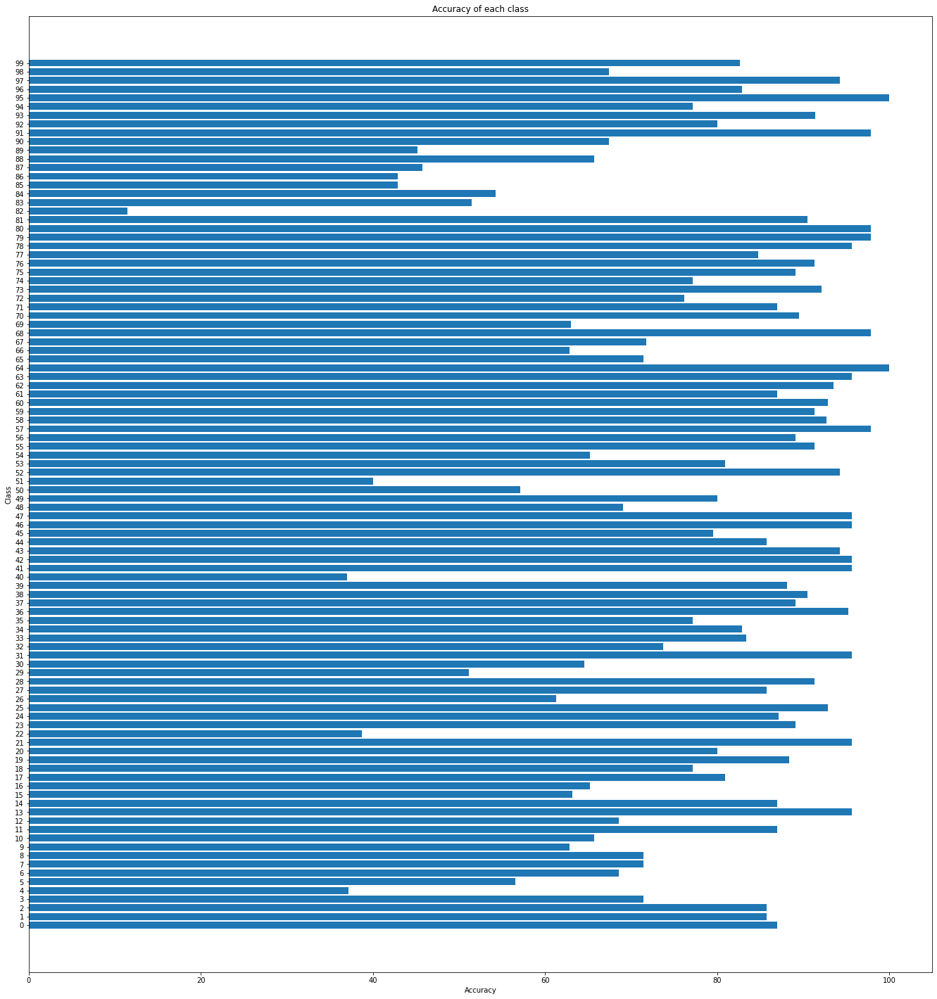

In [35]:
plt.figure(figsize=(23,25))
plt.barh(list(acc_dict.keys()), acc_dict.values(), align='center')
plt.title('Accuracy of each class')
plt.xlabel('Accuracy')
plt.ylabel('Class')

# Analiza błędów

In [36]:
def plot_cms(y_true, y_pred):
    cm = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_true, y_pred))
    cm.plot()
    plt.show()

In [37]:
def plot_k_random_samples(k, classname):
    random_samples = torch.stack([dataset_orig[i][0] for i in random.sample(classes_indices_dict[int(classname)], k=k)], 0)
    print(f"Random samples of class: {classname} - accuracy: {acc_dict[classname]:.2f}%")
    imshow(torchvision.utils.make_grid(random_samples))

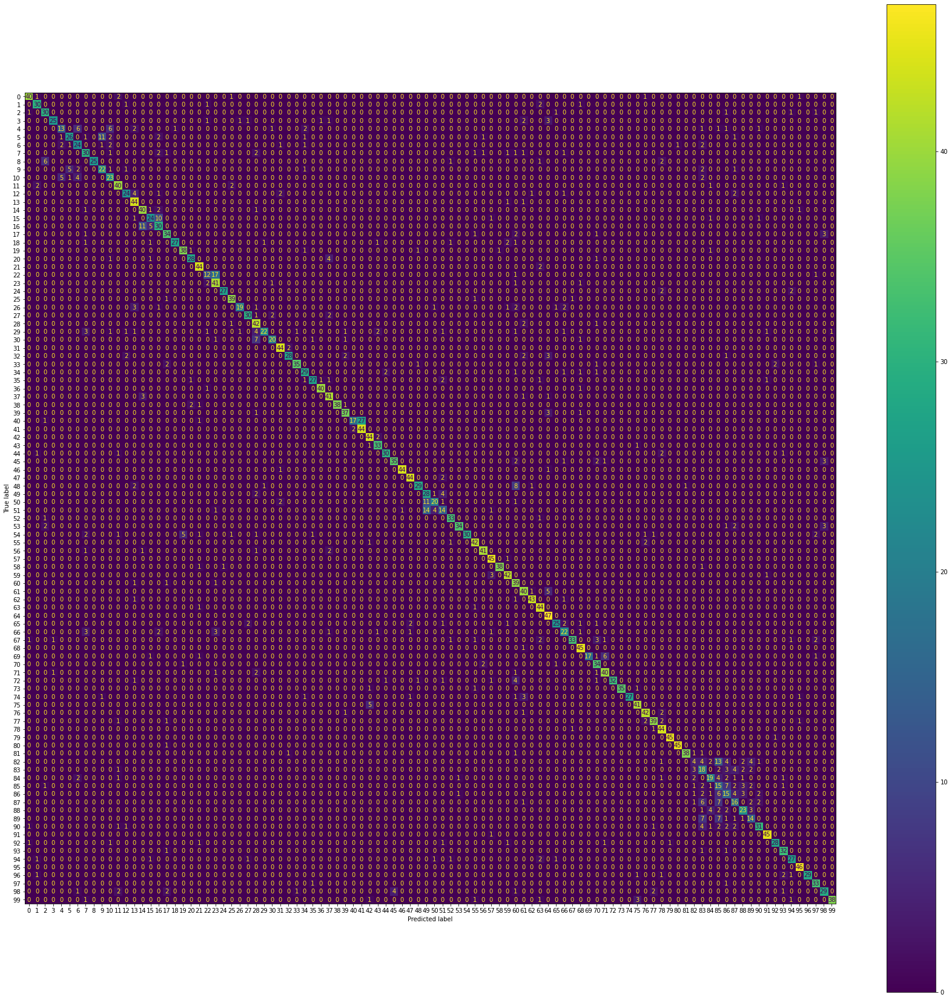

In [51]:
plt.rcParams['figure.figsize'] = (30,30)
plot_cms(y_true, y_pred)

In [39]:
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.91      0.87      0.89        46
           1       0.83      0.86      0.85        35
           2       0.73      0.86      0.79        35
           3       0.93      0.71      0.81        35
           4       0.62      0.37      0.46        35
           5       0.79      0.57      0.66        46
           6       0.62      0.69      0.65        35
           7       0.68      0.71      0.70        42
           8       1.00      0.71      0.83        35
           9       0.63      0.63      0.63        35
          10       0.61      0.66      0.63        35
          11       0.80      0.87      0.83        46
          12       0.80      0.69      0.74        35
          13       0.73      0.96      0.83        46
          14       0.73      0.87      0.79        46
          15       0.71      0.63      0.67        38
          16       0.60      0.65      0.63        46
          17       0.77    

### Analiza klas z niskim accuracy
Klasy z accuracy poniżej 50%:

In [40]:
missclassified = {classname : acc for classname, acc in acc_dict.items() if acc < 50.0}

In [41]:
missclassified

{'4': 37.142857142857146,
 '22': 38.70967741935484,
 '40': 36.95652173913044,
 '51': 40.0,
 '82': 11.428571428571429,
 '85': 42.857142857142854,
 '86': 42.857142857142854,
 '87': 45.714285714285715,
 '89': 45.16129032258065}

Wizualizacja kilku próbek z tych klas

Random samples of class: 4 - accuracy: 37.14%


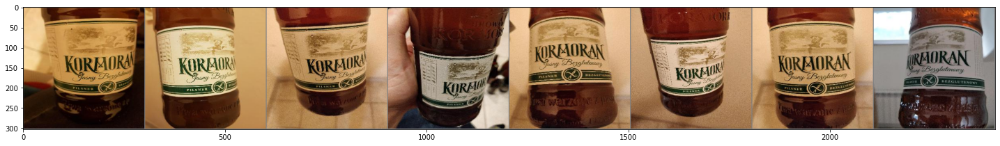

Random samples of class: 22 - accuracy: 38.71%


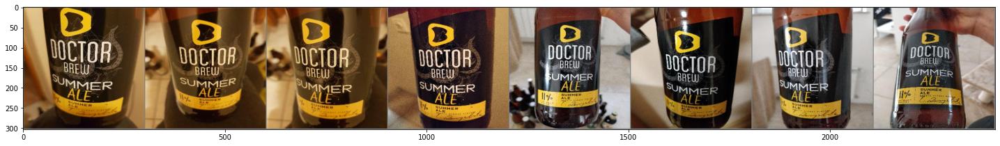

Random samples of class: 40 - accuracy: 36.96%


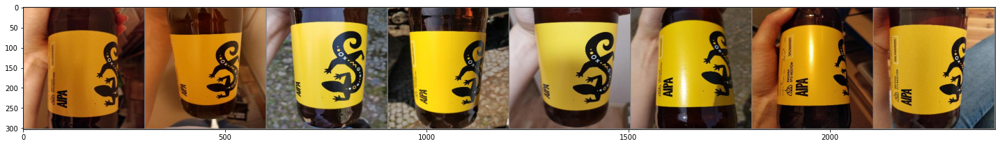

Random samples of class: 51 - accuracy: 40.00%


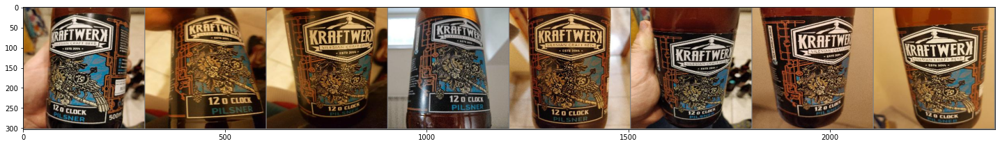

Random samples of class: 82 - accuracy: 11.43%


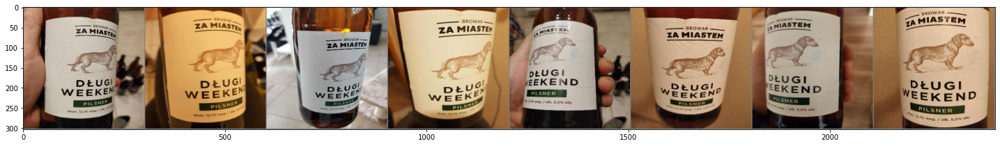

Random samples of class: 85 - accuracy: 42.86%


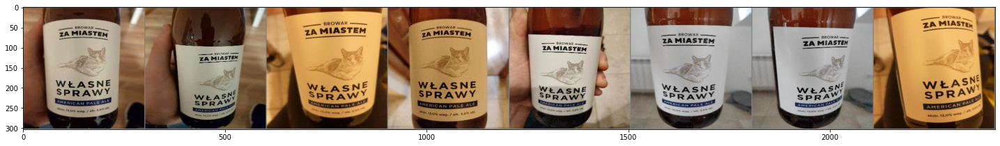

Random samples of class: 86 - accuracy: 42.86%


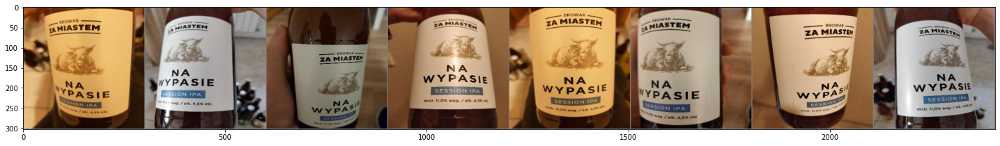

Random samples of class: 87 - accuracy: 45.71%


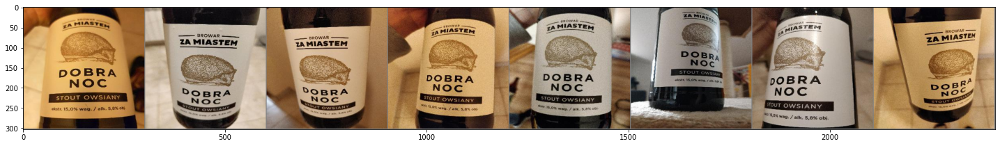

Random samples of class: 89 - accuracy: 45.16%


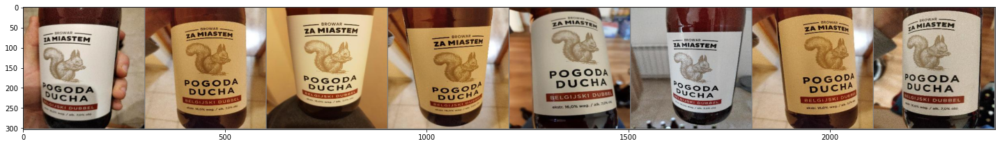

In [42]:
for classname in missclassified.keys():
    plot_k_random_samples(8, classname)

##### Klasy 82-89
Model słabo radzi sobie z klasyfikacją klas przedstawionych poniżej. Po przyjrzeniu się próbkom z tych klas można zauważyć, że klasy od 82 do 89:
 - Przedstawiają bardzo podobne obrazy,
 - Wszystkie piwa mają etykiety z białym tłem,
 - Mają wiele elementów wspólnych, wszystkie są wykonane według podobnego schematu, przez co prawdopodobnie są wzajemnie mylone,
 - Zawierają one mało cech szczególnych,
 - Etykiety są białe lub żółte, w zależności od oświetlenia pomieszczenia w którym zostało wykonane zdjęcie. Należy również zauważyć, że w wielu przypadkach dominującymi kolorami tła obrazu są właśnie kolory białe (na przykład kiedy zdjęcie jest wykonane na tle ściany) lub żółte (na przykład kiedy zdjęcie jest wykonane na tle podłogi). To tym bardziej utrudnia poprawną klasyfikację modelowi.<br>

Klasy te są wzajemnie mylone, dlatego mała część z próbek należących do tych klas jest poprawnie klasyfikowana - stąd niskie wartości metryk dla każdej z tych klas.

Random samples of class: 82 - accuracy: 11.43%


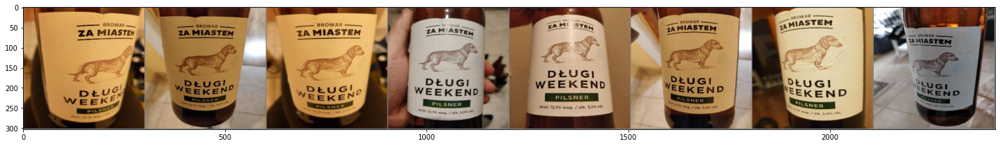

Random samples of class: 83 - accuracy: 51.43%


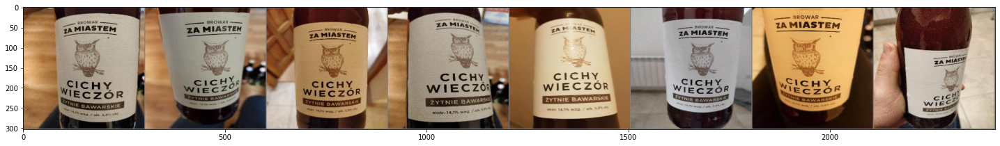

Random samples of class: 84 - accuracy: 54.29%


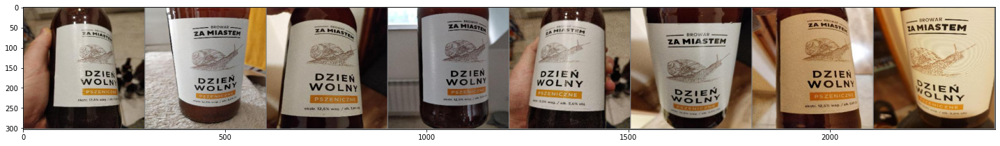

Random samples of class: 85 - accuracy: 42.86%


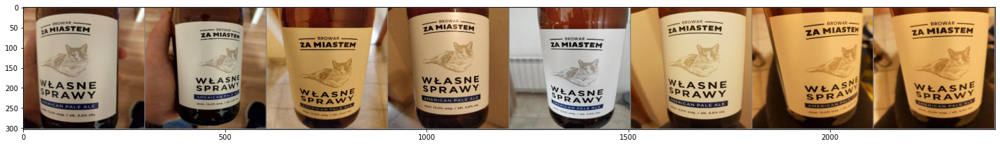

Random samples of class: 86 - accuracy: 42.86%


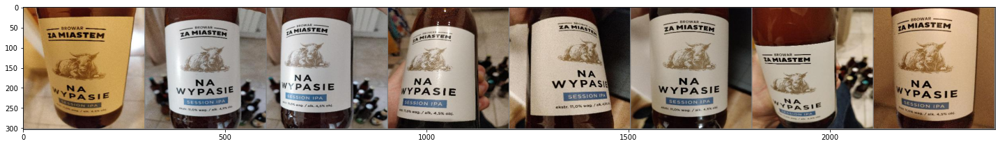

Random samples of class: 87 - accuracy: 45.71%


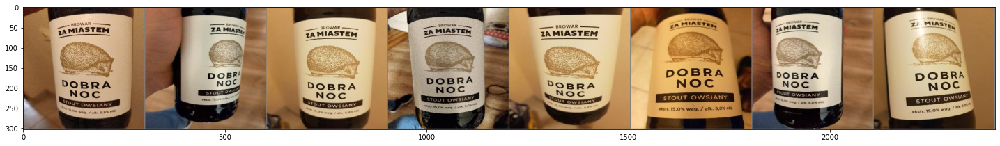

Random samples of class: 88 - accuracy: 65.71%


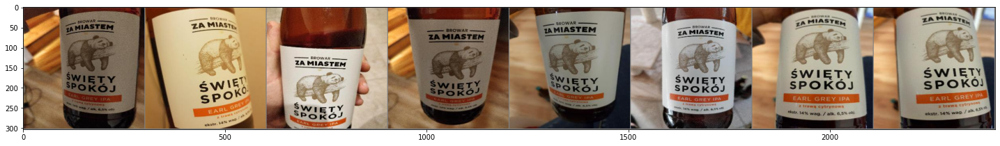

Random samples of class: 89 - accuracy: 45.16%


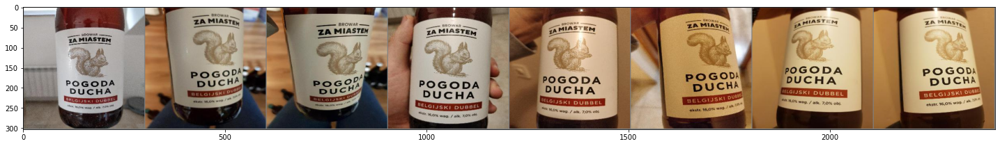

In [50]:
plot_k_random_samples(8, '82')
plot_k_random_samples(8, '83')
plot_k_random_samples(8, '84')
plot_k_random_samples(8, '85')
plot_k_random_samples(8, '86')
plot_k_random_samples(8, '87')
plot_k_random_samples(8, '88')
plot_k_random_samples(8, '89')

##### Klasy 49, 50 i 51
Każda z tych klas przedstawia piwo tej samej marki z podobną etykietą, która ma wiele szczegółów. Pomimo innej kolorystyki problem może tu stanowić duże logo marki, które w obydwu przypadkach jest identyczne. Model nie zdołał nauczyć się odróżniać tych klas po pozostałych elementach etykiety.

Klasy są wzajemnie mylone, a duża część próbek z tych klas jest klasyfikowana przez model jako klasa 49, dlatego też ta klasa ma wysoką wartość metryki accuracy. Natomiast każda z tych klas ma bardzo niskie wartości pozostałych metryk.

Random samples of class: 49 - accuracy: 80.00%


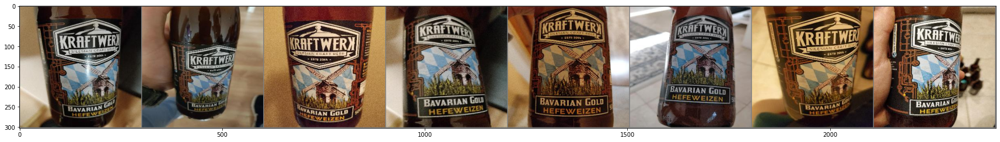

Random samples of class: 50 - accuracy: 57.14%


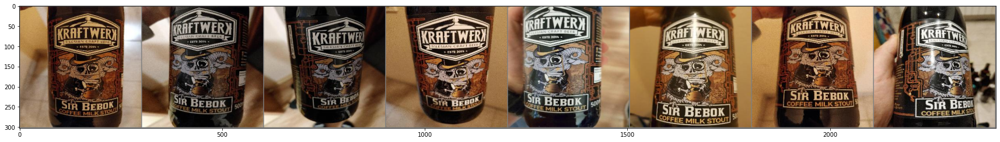

Random samples of class: 51 - accuracy: 40.00%


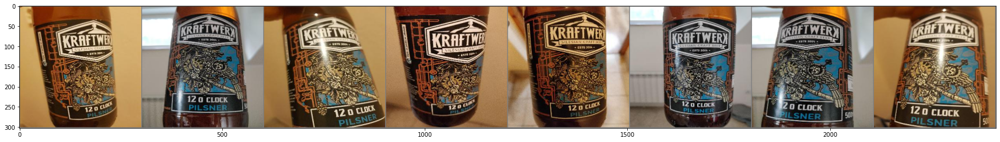

In [52]:
plot_k_random_samples(8, '49')
plot_k_random_samples(8, '50')
plot_k_random_samples(8, '51')

##### Klasy 40 i 41
Klasy przedstawiają piwa o prawie identycznych etykietach - jedynie czym się różnią bo nazwą rodzaju piwa ("aipa" oraz "black ipa"). Nawet człowiek miałby problem z pewnej odległości odróżnić obie klasy.
Większość próbek z tych klas klasyfikowana jest przez model jako klasa 41 - dlatego też ta klasa ma wysoką wartość metryki accuracy.

Random samples of class: 40 - accuracy: 36.96%


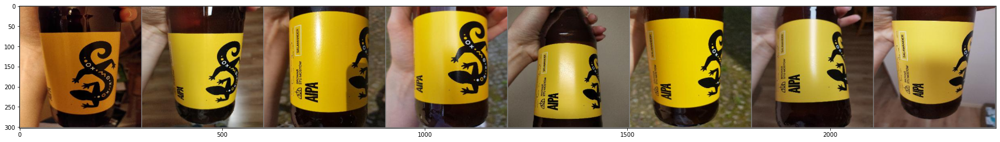

Random samples of class: 41 - accuracy: 95.65%


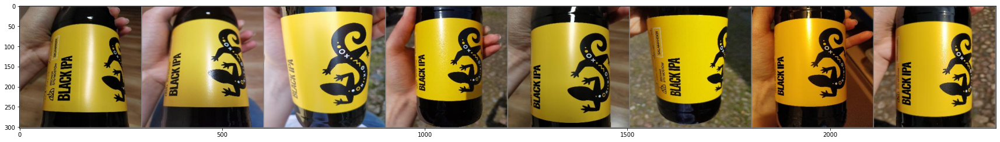

In [53]:
plot_k_random_samples(8, '40')
plot_k_random_samples(8, '41')

##### Klasy 4, 6, i 10
Ponownie klasy przedstawiają piwa o bardzo podobnych etykietach, w których dominuje kolor biały i zielony. W obu przypadkach etykiety mają białe tło, a bardziej szczegółowe elementy są w kolorze zielonym.

Random samples of class: 4 - accuracy: 37.14%


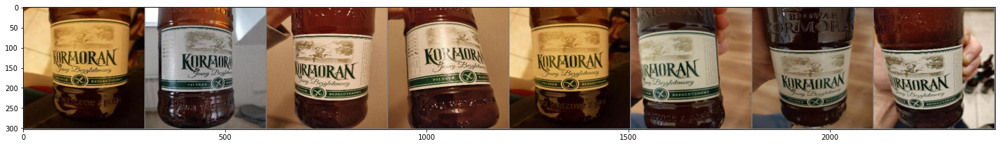

Random samples of class: 6 - accuracy: 68.57%


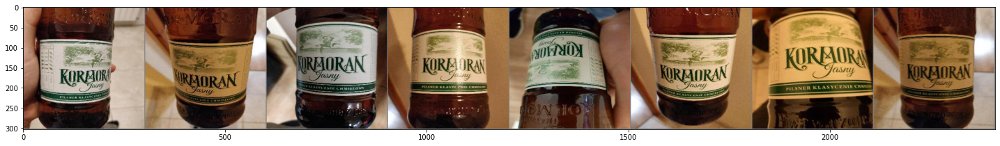

Random samples of class: 10 - accuracy: 65.71%


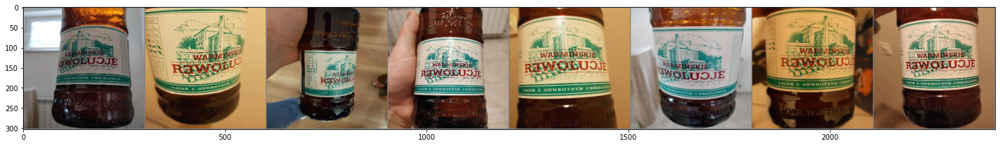

In [49]:
plot_k_random_samples(8, '4')
plot_k_random_samples(8, '6')
plot_k_random_samples(8, '10')

##### Klasy 22 i 23
W obu etykietach dominuje kolor czarny, ponadto napisy są prawie identyczne. Model miał problem w dobrym odróżnieniu piw po drugim dominującym kolorze na etykiecie - czyli odpowiednio żółtym i czerwonym. Jednak w porównaniu z poprzednimi przypadkami model nie poradził sobie tak źle.

Random samples of class: 22 - accuracy: 38.71%


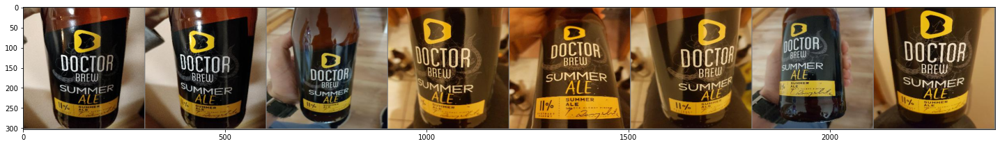

Random samples of class: 23 - accuracy: 89.13%


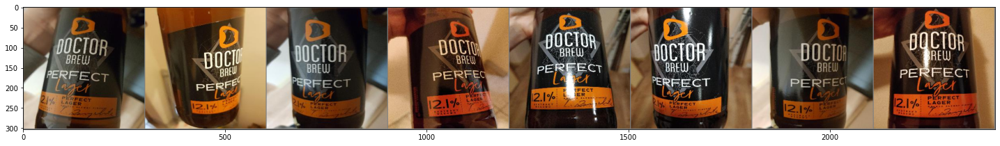

In [47]:
plot_k_random_samples(8, '22')
plot_k_random_samples(8, '23')

# Proponowane rozwiązanie problemów
- Wprowadzenie ważenia klas, które są mylone przez model. W ten sposób model byłby bardziej karany za popełnienie błędu przy klasyfikacji tych klas i miałby szanse lepiej nauczyć się odróżniać problematyczne próbki.
- Zakładamy, że nie mamy dostępu do dodatkowych danych. Natomiast można wygenerować dodatkowe próbki danych za pomocą augmentacji danych. Dzięki temu model będzie miał większe szanse dokładniejszego nauczenia się odróżniania klas.